In [1]:
import scanpy as sc
import anndata2ri
import pandas as pd
import scib
import numpy as np

In [2]:
import colorcet as cc
import seaborn as sns

In [3]:
import sys
from pathlib import Path

In [4]:
sys.path.append(str(Path.home() / 'Code/sctoolkit/'))

In [142]:
from sctoolkit.proportions import plot_proportion_barplot
from sctoolkit.utils import run_spring

In [6]:
from harmony import harmonize

In [7]:
sc.set_figure_params(dpi=100, vector_friendly=False)

/home/gokcen/.miniconda3/lib/python3.8/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`


In [8]:
pd.options.display.max_columns = 50

In [9]:
anndata2ri.activate()

/home/gokcen/.miniconda3/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:261: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
/home/gokcen/.miniconda3/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:185: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.


In [10]:
%load_ext rpy2.ipython

## Prostate

In [42]:
prostate = sc.read('prostate.h5ad')

sc.pp.normalize_total(prostate, target_sum=10_000)
sc.pp.log1p(prostate)
sc.pp.highly_variable_genes(prostate, n_top_genes=1000, batch_key='orig.ident')
sc.pp.pca(prostate)

/home/gokcen/.local/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [43]:
pd.crosstab(prostate.obs['orig.ident'], prostate.obs.prep)

prep,TST,cells
orig.ident,,
prostate_01_TST,4359,0
prostate_02_TST,545,0
prostate_03_TST,3891,0
prostate_04_TST,2059,0
prostate_d17,0,32785
prostate_d27,0,39361
prostate_pd,0,35712


In [44]:
label_samples = {
    'prostate_01_TST': 'snRNA-seq, TST, 01',
    'prostate_02_TST': 'snRNA-seq, TST, 02',
    'prostate_03_TST': 'snRNA-seq, TST, 03',
    'prostate_04_TST': 'snRNA-seq, TST, 04',    
    'prostate_d17': 'scRNA-seq, d17',
    'prostate_d27': 'scRNA-seq, d27',
    'prostate_pd':  'scRNA-seq, pd',    
}
prostate.obs['orig.ident'] = prostate.obs['orig.ident'].map(label_samples)

In [45]:
pal = sns.color_palette(cc.glasbey_hv)
pal = pal.as_hex()

prostate.uns['labels_colors'] = pal
prostate.uns['broad_labels_colors'] = pal
prostate.uns['orig.ident_colors'] = pal

prostate.obs['broad_labels'] = prostate.obs['labels'].copy()
prostate.obs['broad_labels'] = [x.replace(' III', '').replace(' II', '').replace(' I', '').replace('Myocyte (smooth muscle)', 'Pericyte/SMC') for x in prostate.obs['broad_labels']]
prostate._sanitize()

prostate.obs.prep = prostate.obs.prep.str.replace('cells', 'scRNA-seq (Henry et al.)').str.replace('TST', 'snRNA-seq (TST)')
prostate.uns['prep_colors'] = ['darkgray', '#24467c']

/home/gokcen/.miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'broad_labels' as categorical


In [46]:
prostate.obsm['X_harmony'] = harmonize(prostate.obsm['X_pca'], prostate.obs, 'orig.ident')

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).


In [47]:
sc.pp.neighbors(prostate, use_rep='X_harmony')
sc.tl.umap(prostate)

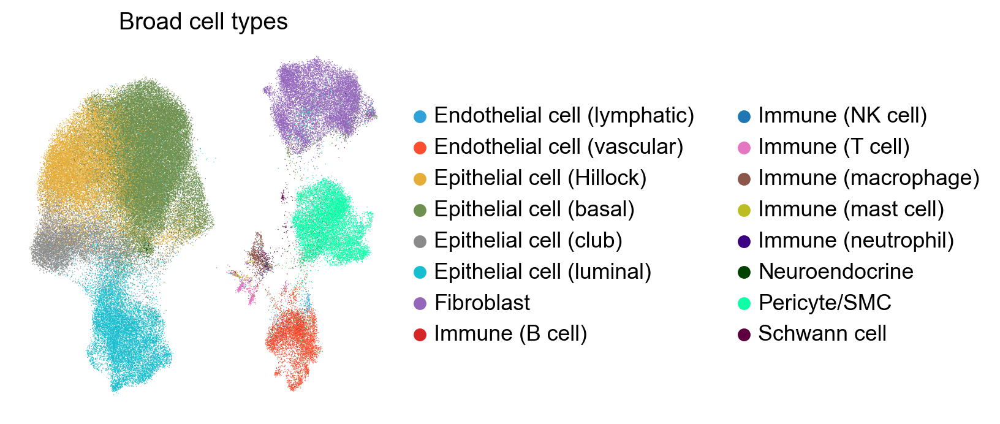

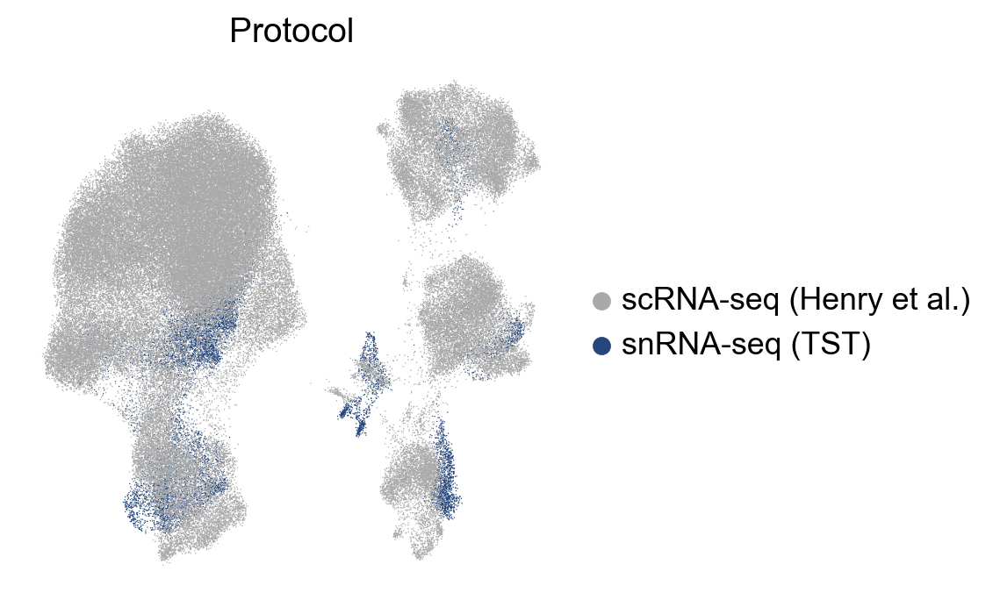

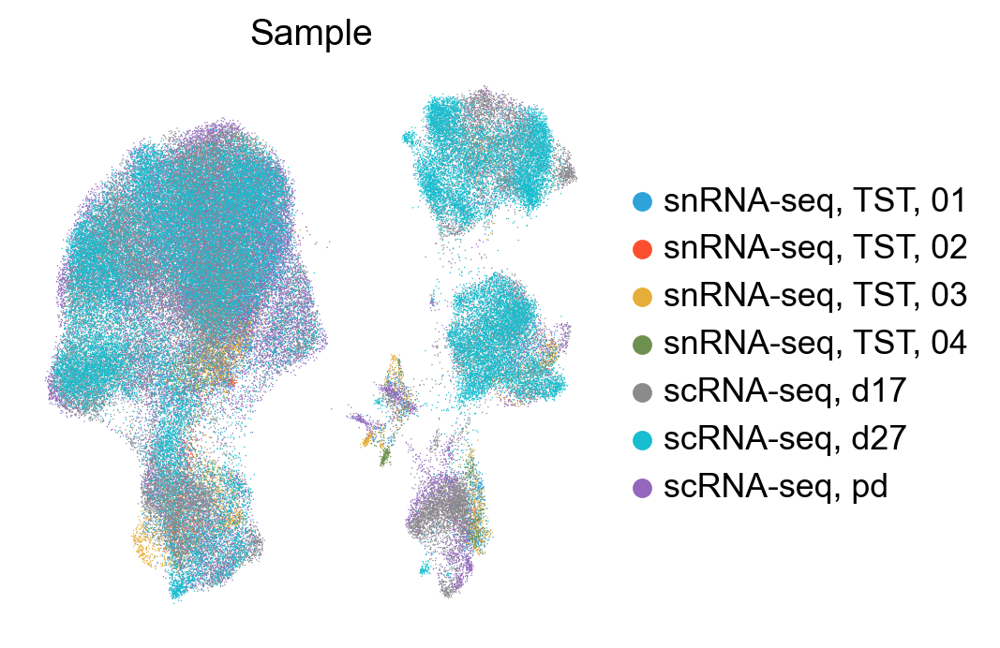

In [57]:
sc.pl.umap(prostate, color=['broad_labels'], frameon=False, title=['Broad cell types'], save='-A-prostate-broadcelltypes.pdf')
sc.pl.umap(prostate, color=['prep'], frameon=False, title=['Protocol'], save='-B-prostate-protocols.pdf')
sc.pl.umap(prostate, color=['orig.ident'], frameon=False, title=['Sample'], save='-C-prostate-samples.pdf')

In [ ]:
from plotnine import *

In [ ]:
g = plot_proportion_barplot(prostate, 'orig.ident', 'labels', fill_label='Granular cell types', yaxis_label='Sample')
ggsave(g, 'figures/umap-D-prostate-proportions.pdf')
g

## scRNA-seq only

In [50]:
prostate_cell = prostate[prostate.obs.prep == 'scRNA-seq (Henry et al.)'].copy()
sc.pp.filter_cells(prostate_cell, min_genes=100)
prostate_cell

AnnData object with n_obs × n_vars = 107858 × 33694
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'cellnames', 'prep', 'Broad_cell_type', 'granular_cell_type', 'compartment', 'individual', 'granular', 'nGene', 'nUMI', 'percent.mito', 'res.1', 'cluster', 'celltype', 'class', 'sc_class', 'markers', 'new_celltype', 'RNA_snn_res.1', 'seurat_clusters', 'ident', 'labels', 'broad_labels', 'n_genes'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg', 'pca', 'prep_colors', 'neighbors', 'umap'
    obsm: 'HARMONY', 'X_pca', 'X_umap', 'X_harmony'
    varm: 'PCs'
    layers: 'logcounts'
    obsp: 'distances', 'connectivities'

In [51]:
sc.pp.highly_variable_genes(prostate_cell, n_top_genes=1000, batch_key='orig.ident')
sc.pp.pca(prostate_cell)

/home/gokcen/.local/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [52]:
prostate_cell._sanitize()

In [53]:
prostate_cell.obsm['X_harmony'] = harmonize(prostate_cell.obsm['X_pca'], prostate_cell.obs, 'orig.ident')

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
Reach convergence after 5 iteration(s).


In [54]:
sc.pp.neighbors(prostate_cell, use_rep='X_harmony')
sc.tl.umap(prostate_cell)

In [55]:
pal = sns.color_palette(cc.glasbey_hv)
pal = pal.as_hex()

prostate_cell.uns['labels_colors'] = pal
prostate_cell.uns['broad_labels_colors'] = pal
prostate_cell.uns['orig.ident_colors'] = pal

prostate_cell._sanitize()

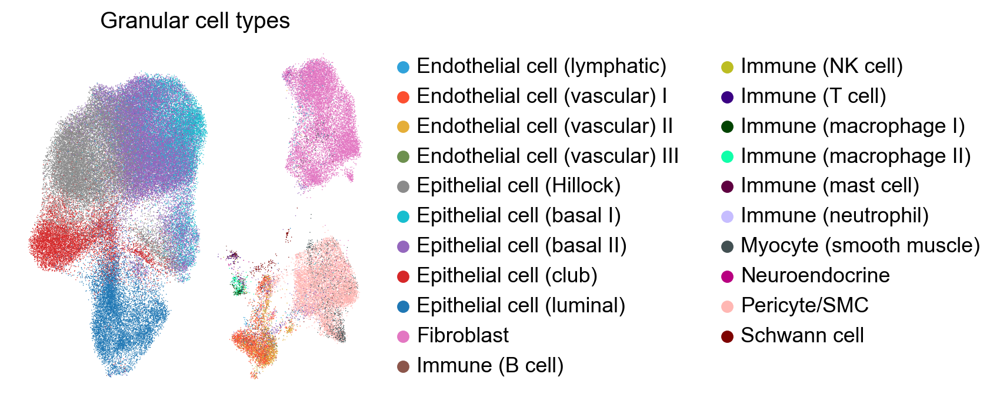

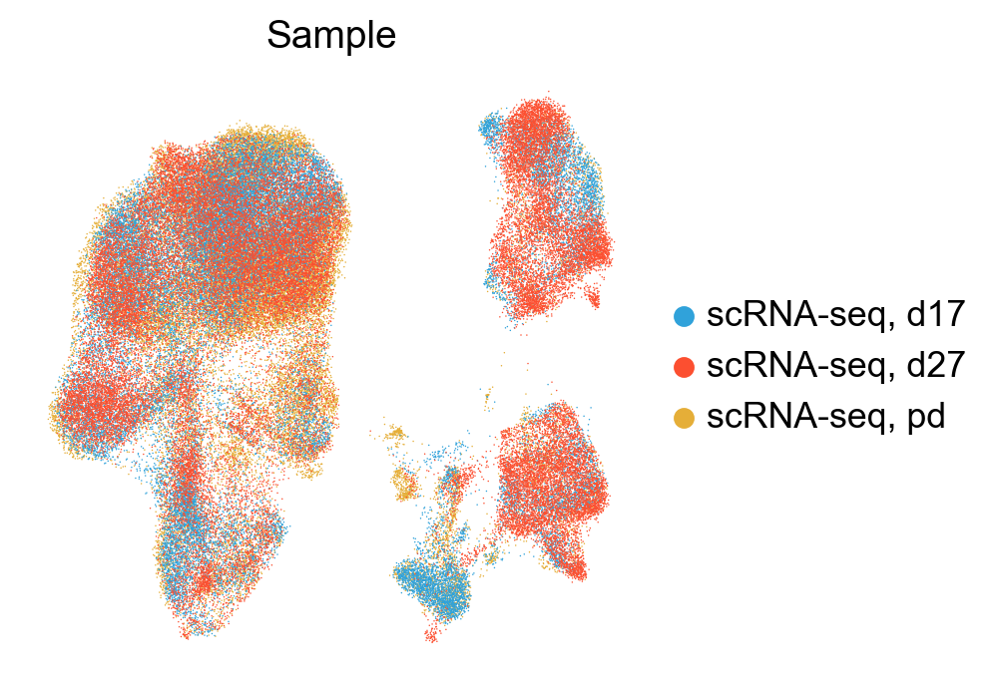

In [62]:
sc.pl.umap(prostate_cell, color=['labels'], frameon=False, title=['Granular cell types'], save='-E-prostate-granularcelltypes.pdf')
sc.pl.umap(prostate_cell, color=['orig.ident'], frameon=False, title=['Sample'], save='-F-prostate-granularcelltypes.pdf')

prostate_cell.layers['scaled'] = prostate_cell.X.copy()
sc.pp.scale(prostate_cell, max_value=8, layer='scaled')

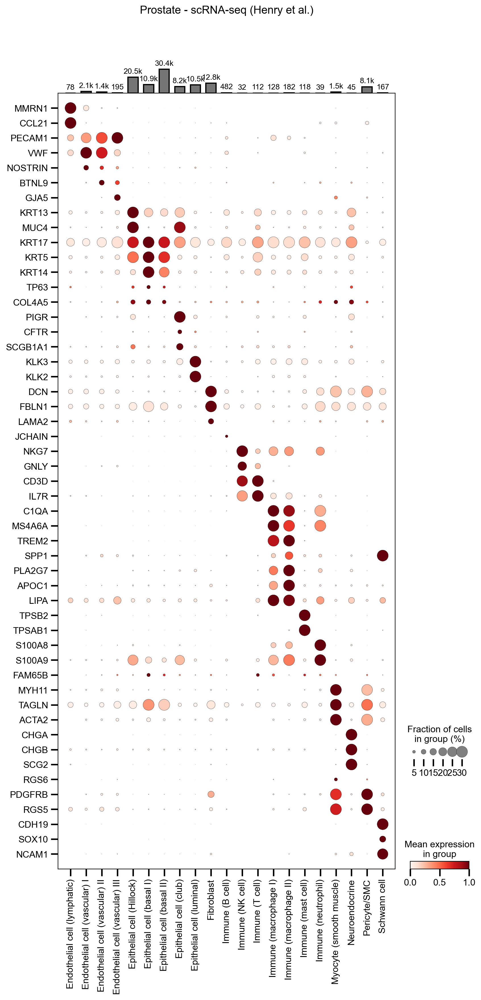

In [64]:
genes = [
    'MMRN1', 'CCL21', 'PECAM1', 'VWF', 'NOSTRIN', 'BTNL9', 'GJA5',
    'KRT13', 'MUC4',
    'KRT17', 'KRT5', 'KRT14', 'TP63', 'COL4A5',
    'PIGR', 'CFTR', 'SCGB1A1', 'KLK3', 'KLK2',
    'DCN', 'FBLN1', 'LAMA2',
    'JCHAIN',
    'NKG7', 'GNLY', 'CD3D', 'IL7R',
    'C1QA', 'MS4A6A',
    'TREM2', 'SPP1', 'PLA2G7', 'APOC1', 'LIPA',    
    'TPSB2', 'TPSAB1', 
    'S100A8', 'S100A9', 'FAM65B',
    'MYH11', 'TAGLN', 'ACTA2',
    'CHGA', 'CHGB', 'SCG2',
    'RGS6', 'PDGFRB', 'RGS5',
    'CDH19', 'SOX10', 'NCAM1',
]

g = sc.pl.dotplot(prostate_cell, 
                  var_names=genes,
                  standard_scale='var', cmap='Reds', groupby='labels', title='Prostate - scRNA-seq (Henry et al.)', dot_max=.3, return_fig=True, swap_axes=True)

g.add_totals(color='#757575')
g.savefig('figures/umap-G-prostate-dotplot.pdf');

## Skin

In [33]:
skin = sc.read('skin.h5ad')
ch = skin.obs['orig.ident'].value_counts()>100
ch = ch[ch].index
skin = skin[skin.obs['orig.ident'].isin(ch)]

skin.layers['counts'] = skin.X.copy()
sc.pp.normalize_total(skin, target_sum=10_000)
sc.pp.log1p(skin)
sc.pp.highly_variable_genes(skin, n_top_genes=1000, flavor='seurat_v3', layer='counts')
sc.pp.pca(skin)

In [34]:
pd.crosstab(skin.obs['orig.ident'], skin.obs.prep)

prep,CST,TST,cells
orig.ident,,,
skin003_l,0,0,4965
skin003_m,0,0,5319
skin_01_CST,622,0,0
skin_01_TST,0,2711,0
skin_02_l,0,0,4976
skin_02_m,0,0,11939


In [35]:
label_samples = {
    'skin_01_CST': 'snRNA-seq, TST, 01',
    'skin_01_TST': 'snRNA-seq, CST, 01',
    'skin003_l': 'scRNA-seq, Sample 1',
    'skin003_m': 'scRNA-seq, Sample 2',    
    'skin_02_l': 'scRNA-seq, Sample 3',
    'skin_02_m': 'scRNA-seq, Sample 4',
}
skin.obs['orig.ident'] = skin.obs['orig.ident'].map(label_samples)
skin.obs['orig.ident'] = skin.obs['orig.ident'].astype(str)
skin._sanitize()

/home/gokcen/.miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'orig.ident' as categorical


In [36]:
pal = sns.color_palette(cc.glasbey_hv)
pal = pal.as_hex()

skin.uns['broad_labels_colors'] = pal
skin.uns['labels_colors'] = pal
skin.uns['orig.ident_colors'] = pal

skin.obs['broad_labels'] = skin.obs['labels'].copy()
skin.obs['broad_labels'] = [x.replace(' III', '').replace(' II', '').replace(' I', '').replace('Myocyte (smooth muscle)', 'Pericyte/SMC') for x in skin.obs['broad_labels']]
skin.obs['broad_labels'] = ['Sebaceous gland cell' if x.startswith('Sebaceous gland') else x for x in skin.obs['broad_labels']]
skin.obs['broad_labels'] = ['Unknown' if x.startswith('Unknown') else x for x in skin.obs['broad_labels']]
skin.obs['broad_labels'] = ['Immune (DC/macrophage)' if x == 'Immune (Langerhans)' else x for x in skin.obs['broad_labels']]
skin._sanitize()

skin.obs.prep = skin.obs.prep.str.replace('cells', 'scRNA-seq (This study)').str.replace('TST', 'snRNA-seq (TST)').str.replace('CST', 'snRNA-seq (CST)')
skin.uns['prep_colors'] = ['darkgray', '#79a339', '#24467c']

/home/gokcen/.miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'broad_labels' as categorical


In [37]:
skin.obsm['X_harmony'] = harmonize(skin.obsm['X_pca'], skin.obs, 'orig.ident')

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
Reach convergence after 4 iteration(s).


In [38]:
sc.pp.neighbors(skin, use_rep='X_harmony')
sc.tl.umap(skin)

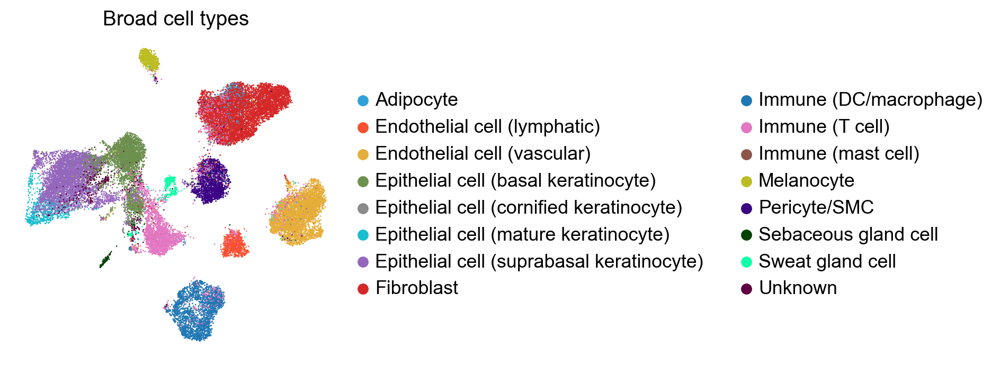

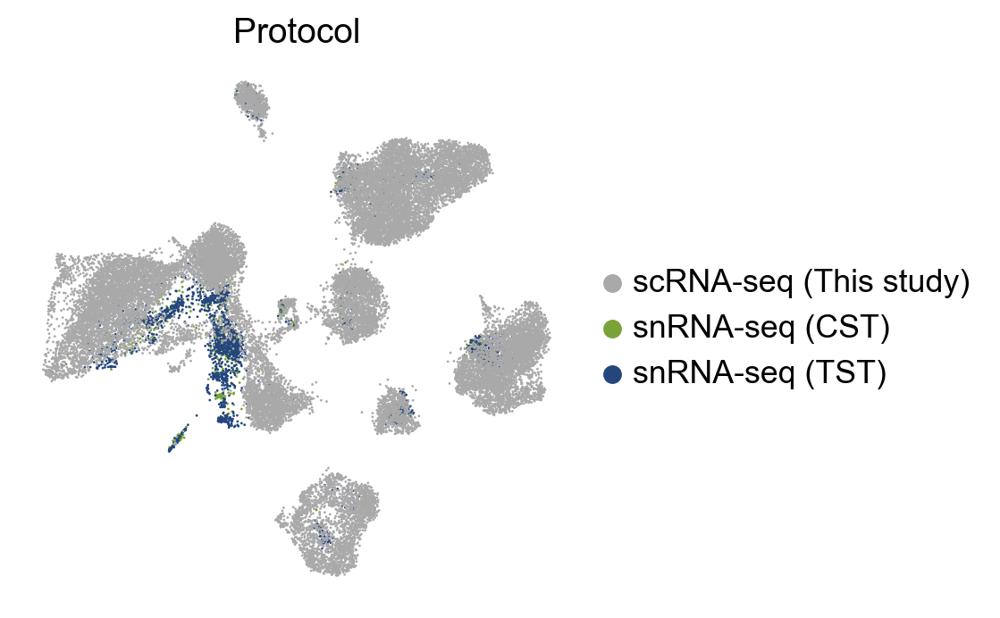

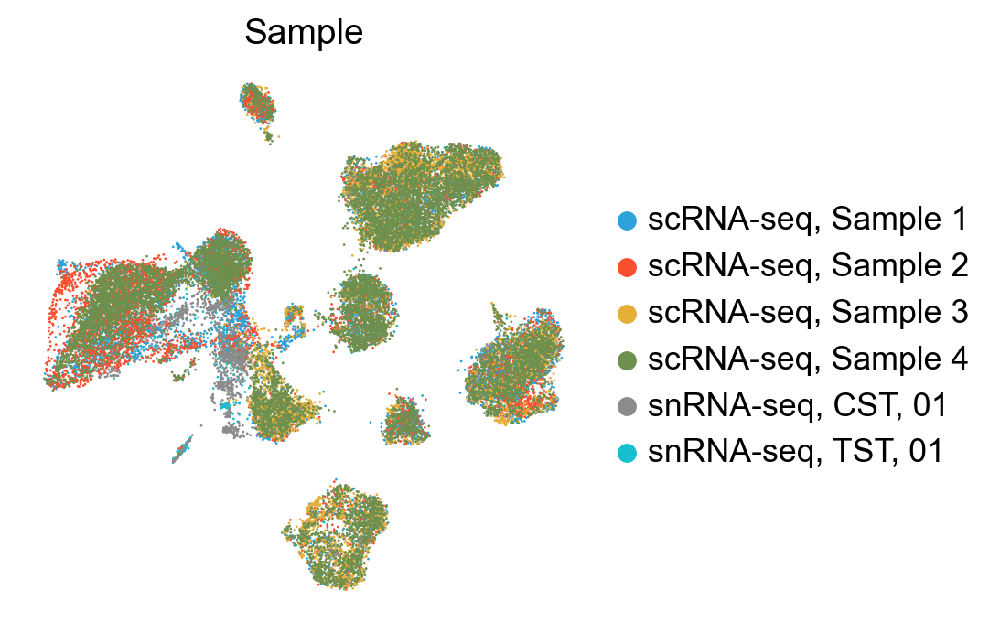

In [79]:
sc.pl.umap(skin, color=['broad_labels'], frameon=False, title=['Broad cell types'], save='-H-skin-broadcelltypes.pdf')
sc.pl.umap(skin, color=['prep'], frameon=False, title=['Protocol'], save='-I-skin-protocols.pdf')
#sc.pl.umap(skin, color=['labels'], frameon=False, title=['Granular cell types'], save='-skin-granularcelltypes.pdf')
sc.pl.umap(skin, color=['orig.ident'], frameon=False, title=['Sample'], save='-J-skin-samples.pdf')

In [80]:
from plotnine import *

/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 8.0 x 2.4000000000000004 in image.
/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: figures/umap-K-skin-proportions.pdf


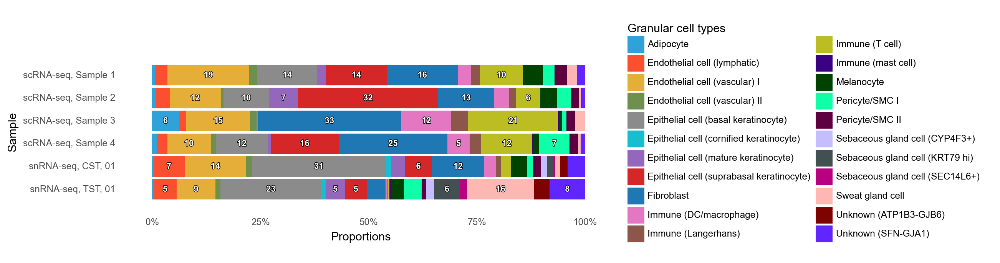

<ggplot: (8790504219501)>

In [81]:
g = plot_proportion_barplot(skin, 'orig.ident', 'labels', fill_label='Granular cell types', yaxis_label='Sample')
ggsave(g, 'figures/umap-K-skin-proportions.pdf')
g

## scRNA-seq only

In [40]:
skin_cell = skin[skin.obs.prep == 'scRNA-seq (This study)'].copy()
sc.pp.filter_cells(skin_cell, min_genes=100)
skin_cell

AnnData object with n_obs × n_vars = 27199 × 33694
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'cellnames', 'prep', 'Broad_cell_type', 'granular_cell_type', 'compartment', 'individual', 'granular', 'RNA_snn_res.1', 'seurat_clusters', 'celltype', 'markers', 'sc_class', 'ident', 'labels', 'broad_labels', 'n_genes'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg', 'pca', 'prep_colors', 'neighbors', 'umap'
    obsm: 'HARMONY', 'X_pca', 'X_umap', 'X_harmony'
    varm: 'PCs'
    layers: 'logcounts', 'counts'
    obsp: 'distances', 'connectivities'

In [41]:
sc.pp.highly_variable_genes(skin_cell, n_top_genes=1000, batch_key='orig.ident')
sc.pp.pca(skin_cell)

/home/gokcen/.local/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [42]:
skin_cell._sanitize()

In [44]:
skin_cell.obsm['X_harmony'] = harmonize(skin_cell.obsm['X_pca'], skin_cell.obs, 'orig.ident')

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
Reach convergence after 9 iteration(s).


In [45]:
sc.pp.neighbors(skin_cell, use_rep='X_harmony')
sc.tl.umap(skin_cell)

In [46]:
pal = sns.color_palette(cc.glasbey_hv)
pal = pal.as_hex()

skin_cell.uns['labels_colors'] = pal
skin_cell.uns['broad_labels_colors'] = pal
skin_cell.uns['orig.ident_colors'] = pal

skin_cell._sanitize()

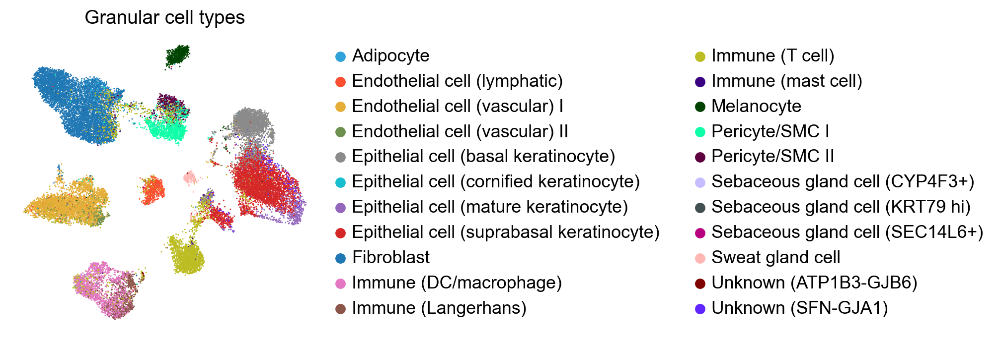

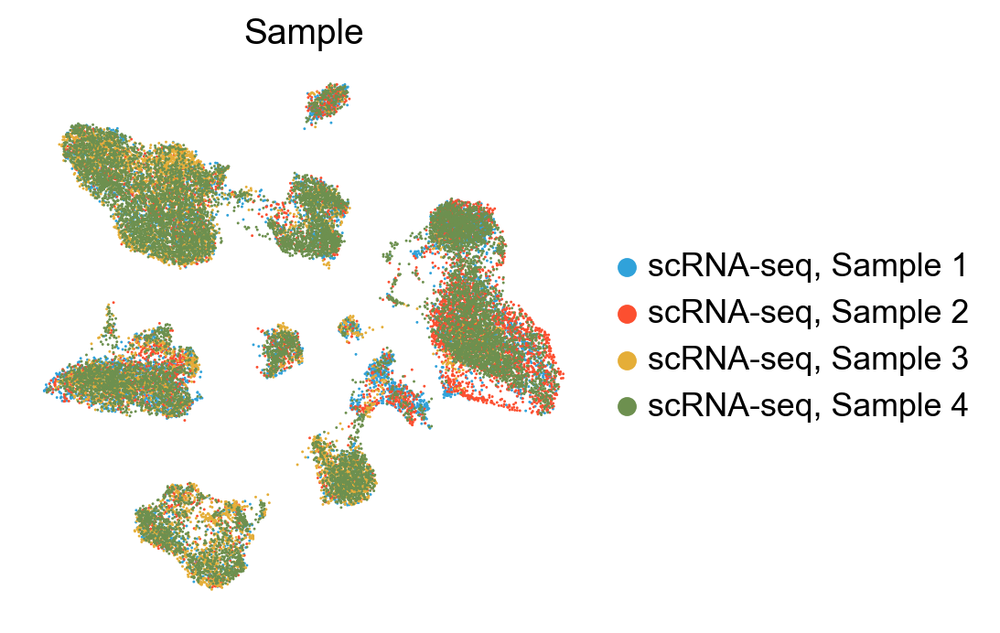

In [82]:
sc.pl.umap(skin_cell, color=['labels'], frameon=False, title=['Granular cell types'], save='-L-skin-granularcelltypes.pdf')
sc.pl.umap(skin_cell, color=['orig.ident'], frameon=False, title=['Sample'], save='-M-skin-granularcelltypes.pdf')

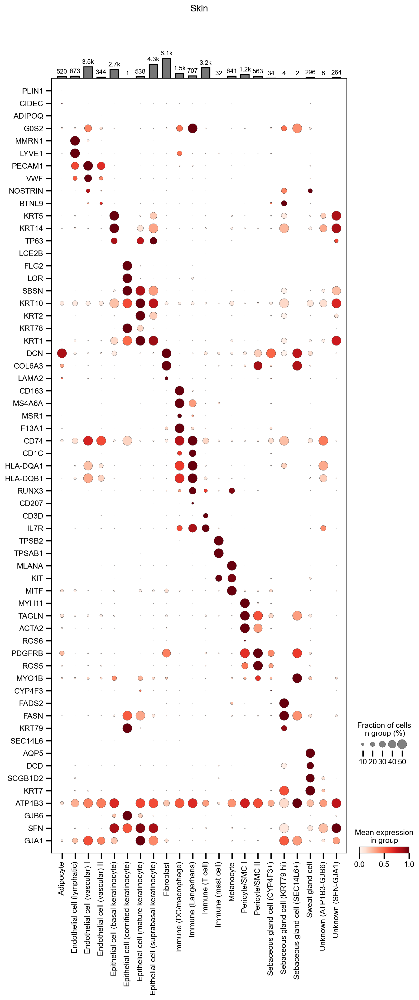

In [83]:
genes = [
    'PLIN1', 'CIDEC', 'ADIPOQ', 'G0S2',
    'MMRN1', 'LYVE1', 'PECAM1', 'VWF', 'NOSTRIN', 'BTNL9',
    'KRT5', 'KRT14', 'TP63', 'LCE2B', 'FLG2', 'LOR', 'SBSN', 'KRT10', 'KRT2', 'KRT78', 'KRT1',
    'DCN', 'COL6A3', 'LAMA2',
    'CD163', 'MS4A6A', 'MSR1', 'F13A1', 'CD74', 'CD1C',
    'HLA-DQA1', 'HLA-DQB1', 'RUNX3', 'CD207',
    'CD3D', 'IL7R',
    'TPSB2', 'TPSAB1', 'MLANA', 'KIT', 'MITF',
    'MYH11', 'TAGLN', 'ACTA2',
    'RGS6', 'PDGFRB', 'RGS5', 'MYO1B',
    'CYP4F3', 'FADS2', 'FASN', 'KRT79', 'SEC14L6',
    'AQP5', 'DCD', 'SCGB1D2', 'KRT7',
    'ATP1B3', 'GJB6', 'SFN', 'GJA1'
]

g = sc.pl.dotplot(skin_cell, 
                  var_names=genes,
                  standard_scale='var', cmap='Reds', groupby='labels', title='Skin', dot_max=.5, return_fig=True, swap_axes=True)
g.add_totals(color='#757575')
g.savefig('figures/umap-N-skin-dotplot.pdf');

## Lung

In [54]:
lung = sc.read('lung_correctcounts.h5ad')

In [55]:
lung.layers['counts'] = lung.X.copy()

In [56]:
sc.pp.normalize_total(lung, target_sum=10_000)
sc.pp.log1p(lung)
sc.pp.highly_variable_genes(lung, n_top_genes=1000, batch_key='orig.ident')
sc.pp.pca(lung)

/home/gokcen/.local/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [57]:
pd.crosstab(lung.obs['orig.ident'], lung.obs.prep)

prep,TST,cells
orig.ident,,
Human Lung 10x - Patient 1,0,7524
Human Lung 10x - Patient 2,0,28793
Human Lung 10x - Patient 3,0,24676
lung_01_TST,3542,0
lung_02_TST,4245,0
lung_03_TST,4196,0


In [58]:
label_samples = {
    'lung_01_TST': 'snRNA-seq, TST, 01',
    'lung_02_TST': 'snRNA-seq, TST, 02',
    'lung_03_TST': 'snRNA-seq, TST, 03',    
    'Human Lung 10x - Patient 1': 'scRNA-seq, Patient 1',
    'Human Lung 10x - Patient 2': 'scRNA-seq, Patient 2',    
    'Human Lung 10x - Patient 3': 'scRNA-seq, Patient 3',
}
lung.obs['orig.ident'] = lung.obs['orig.ident'].map(label_samples)
lung.obs['orig.ident'] = lung.obs['orig.ident'].astype(str)
lung._sanitize()

/home/gokcen/.miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'orig.ident' as categorical


In [59]:
lung.obs['labels'].value_counts().sum()

72976

In [60]:
pal = sns.color_palette(cc.glasbey_hv)
pal = pal.as_hex()

lung.uns['broad_labels_colors'] = pal
lung.uns['labels_colors'] = pal
lung.uns['orig.ident_colors'] = pal

lung.obs['broad_labels'] = lung.obs['labels'].copy()
lung.obs['broad_labels'] = [x.replace(' II)', ' ii)').replace(' I)', ' i)') for x in lung.obs['broad_labels']]
lung.obs['broad_labels'] = [x.replace(' III', '').replace(' II', '').replace(' I', '').replace(' activated', '') for x in lung.obs['broad_labels']]
lung.obs['broad_labels'] = [x.replace(' ii)', ' II)').replace(' i)', ' I)') for x in lung.obs['broad_labels']]
lung.obs['broad_labels'] = ['Immune (DC/macrophage)' if x == 'Immune (Langerhans)' else x for x in lung.obs['broad_labels']]
lung._sanitize()

lung.obs.prep = lung.obs.prep.str.replace('cells', 'scRNA-seq (Travaglini et al.)').str.replace('TST', 'snRNA-seq (TST)')
lung.uns['prep_colors'] = ['darkgray', '#24467c']

/home/gokcen/.miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'broad_labels' as categorical


In [61]:
lung.obsm['X_harmony'] = harmonize(lung.obsm['X_pca'], lung.obs, 'orig.ident')

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
Reach convergence after 5 iteration(s).


In [62]:
sc.pp.neighbors(lung, use_rep='X_harmony')
sc.tl.umap(lung)

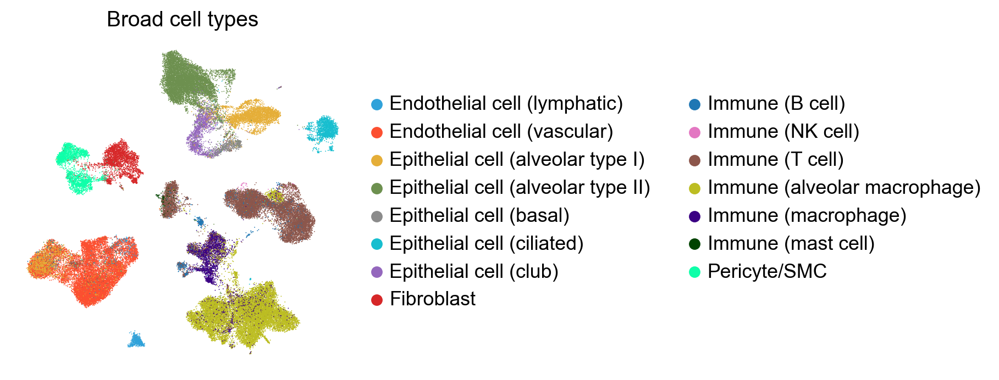

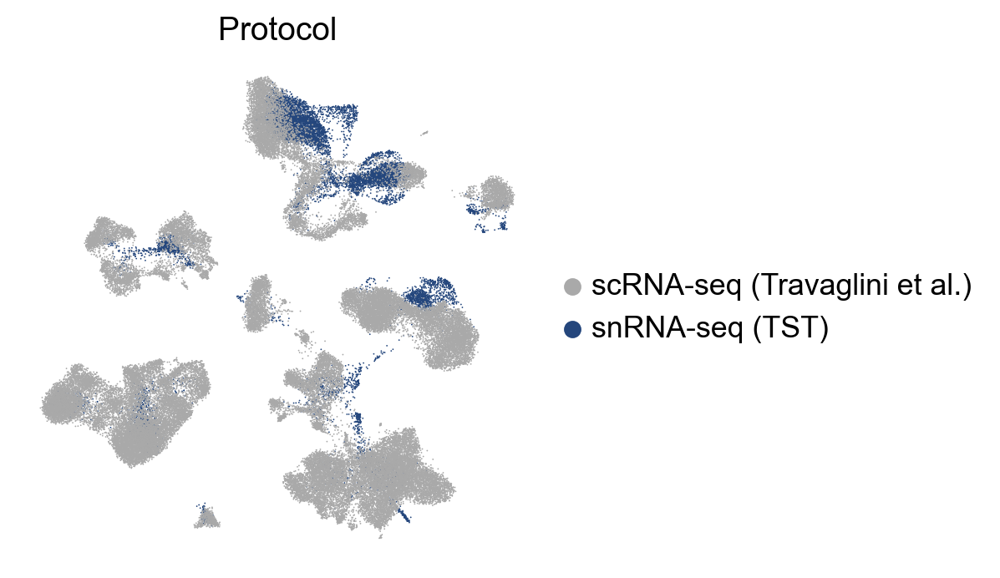

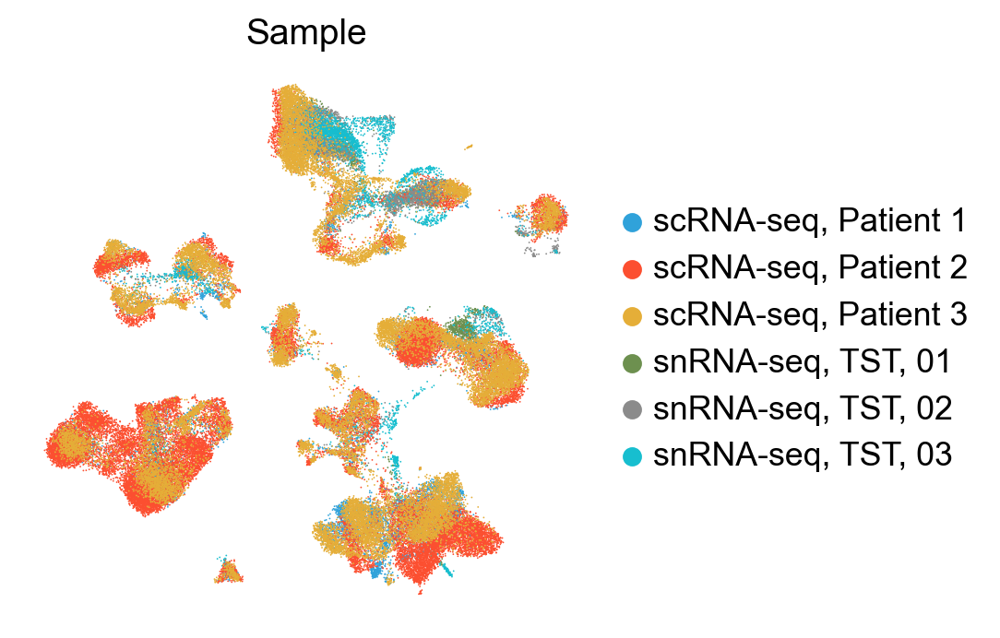

In [84]:
sc.pl.umap(lung, color=['broad_labels'], frameon=False, title=['Broad cell types'], save='-O-lung-broadcelltypes.pdf')
sc.pl.umap(lung, color=['prep'], frameon=False, title=['Protocol'], save='-P-lung-protocols.pdf')
#sc.pl.umap(lung, color=['labels'], frameon=False, title=['Granular cell types'], save='-lung-granularcelltypes.pdf')
sc.pl.umap(lung, color=['orig.ident'], frameon=False, title=['Sample'], save='-Q-lung-samples.pdf')

/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 8.0 x 2.4000000000000004 in image.
/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: figures/umap-R-lung-proportions.pdf


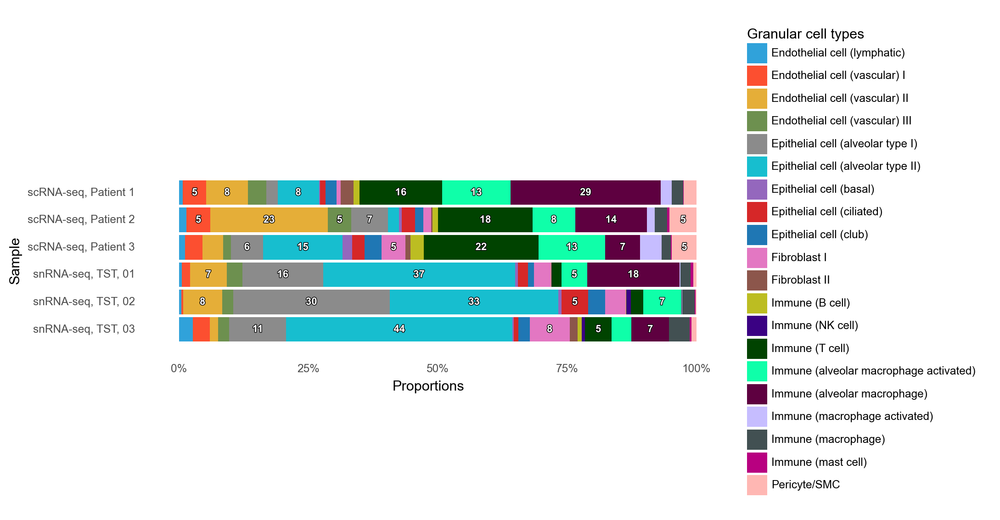

<ggplot: (8790538522546)>

In [85]:
g = plot_proportion_barplot(lung, 'orig.ident', 'labels', fill_label='Granular cell types', yaxis_label='Sample')
ggsave(g, 'figures/umap-R-lung-proportions.pdf')
g

## scRNA-seq only

In [64]:
lung_cell = lung[lung.obs.prep == 'scRNA-seq (Travaglini et al.)'].copy()
sc.pp.filter_cells(lung_cell, min_genes=100)
lung_cell

AnnData object with n_obs × n_vars = 60993 × 28301
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'cellnames', 'prep', 'Broad_cell_type', 'granular_cell_type', 'compartment', 'individual', 'granular', 'nCount_originalexp', 'nFeature_originalexp', 'nGene', 'nUMI', 'channel', 'tissue', 'region', 'percent.ribo', 'free_annotation', 'patient', 'sample', 'location', 'magnetic.selection', 'preparation.site', 'Broad.cell.type', 'not_in_gtex', 'RNA_snn_res.1', 'seurat_clusters', 'ident', 'labels', 'n_genes', 'broad_labels'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg', 'pca', 'prep_colors', 'neighbors', 'umap'
    obsm: 'COMP_TSNE', 'HARMONY', 'X_pca', 'X_tsne', 'X_umap', 'X_harmony'
    varm: 'PCs'
    layers: 'logcounts', 'counts'
    obsp: 'distances', 'connectivities'

<ggplot: (8789758167236)>

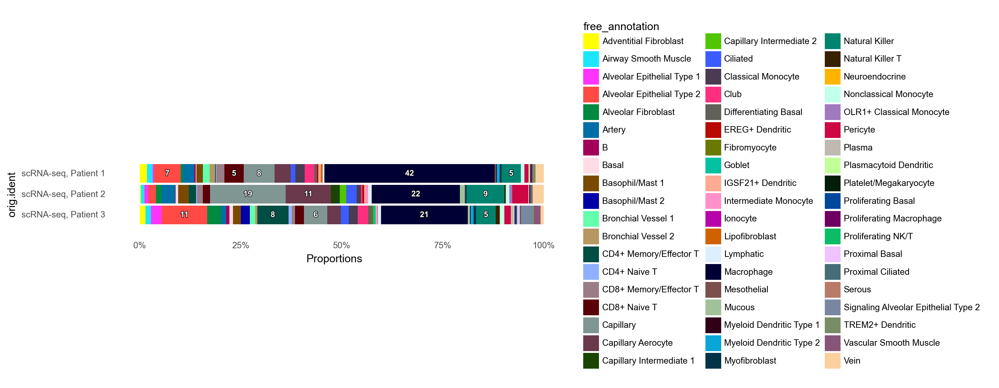

In [197]:
plot_proportion_barplot(lung_cell, 'orig.ident', 'free_annotation')

In [65]:
sc.pp.highly_variable_genes(lung_cell, n_top_genes=1000, batch_key='orig.ident')
sc.pp.pca(lung_cell)

/home/gokcen/.local/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [42]:
lung_cell._sanitize()

In [67]:
lung_cell.obsm['X_harmony'] = harmonize(lung_cell.obsm['X_pca'], lung_cell.obs, 'orig.ident')

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).


In [68]:
sc.pp.neighbors(lung_cell, use_rep='X_harmony')
sc.tl.umap(lung_cell)

In [69]:
pal = sns.color_palette(cc.glasbey_hv)
pal = pal.as_hex()

lung_cell.uns['labels_colors'] = pal
lung_cell.uns['broad_labels_colors'] = pal
lung_cell.uns['orig.ident_colors'] = pal

lung_cell._sanitize()

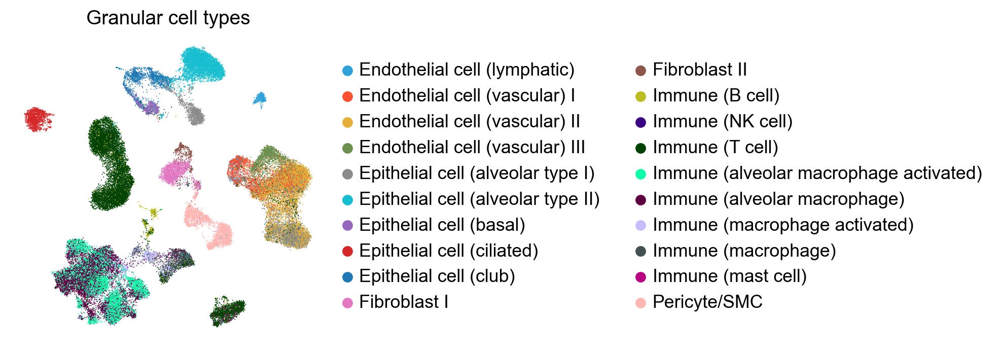

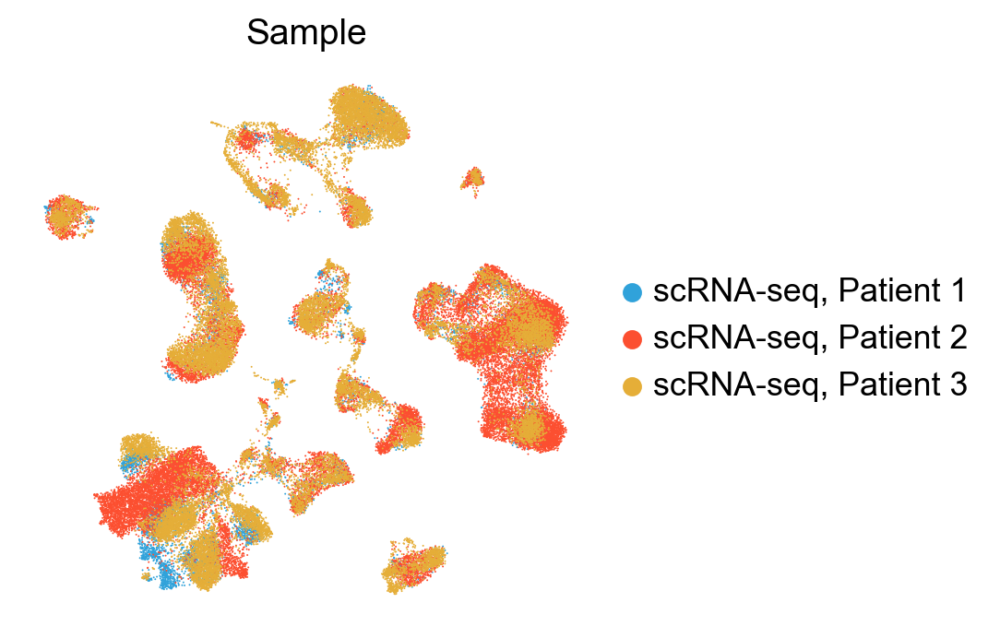

In [86]:
sc.pl.umap(lung_cell, color=['labels'], frameon=False, title=['Granular cell types'], save='-S-lung-granularcelltypes.pdf')
sc.pl.umap(lung_cell, color=['orig.ident'], frameon=False, title=['Sample'], save='-T-lung-samples.pdf')

In [112]:
lung_cell.uns['orig.free_annotation_colors'] = pal.copy()

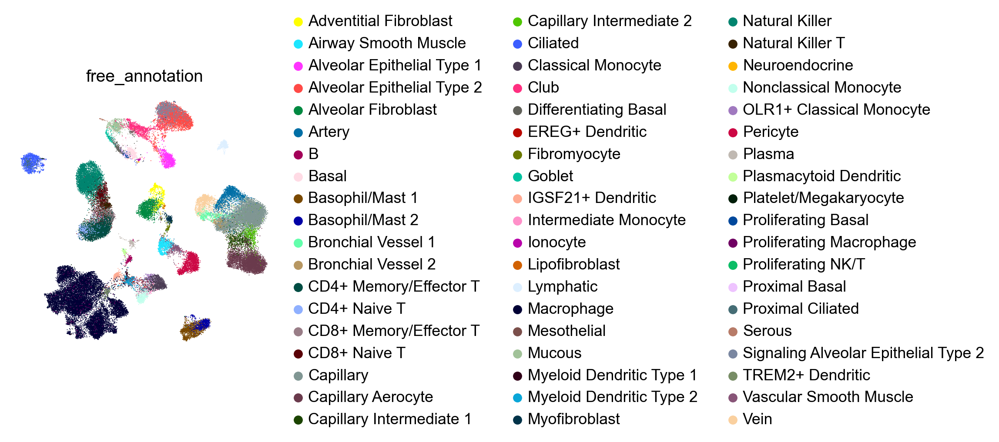

In [113]:
sc.pl.umap(lung_cell, color=['free_annotation'], frameon=False)

In [120]:
fib = lung_cell[lung_cell.obs.free_annotation.isin([x for x in lung_cell.obs.free_annotation.cat.categories if 'ibro' in x])].copy()

In [121]:
sc.tl.rank_genes_groups(fib, 'free_annotation', use_raw=False)

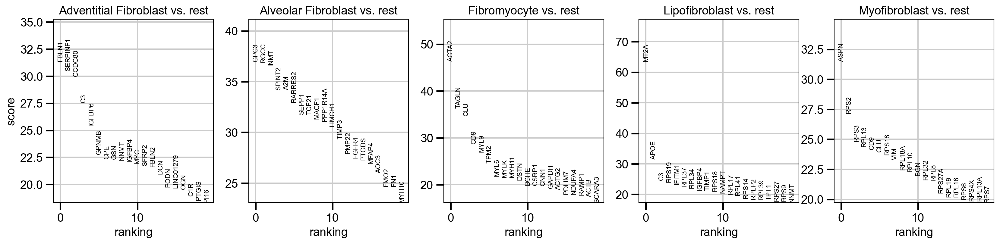

In [123]:
sc.pl.rank_genes_groups(fib, sharey=False, ncols=5)

In [141]:
sc.get.rank_genes_groups_df(fib, group=None, log2fc_min=3, pval_cutoff=.01).to_pickle('fibro_markers_krasnow.pkl')

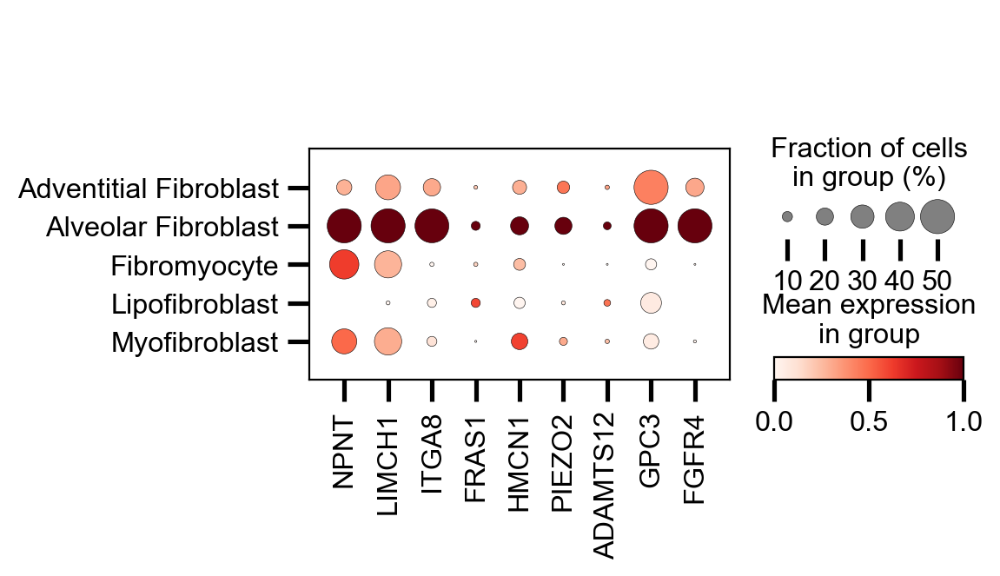

In [156]:
sc.pl.dotplot(fib, ['NPNT', 'LIMCH1', 'ITGA8', 'FRAS1', 'HMCN1', 'PIEZO2', 'ADAMTS12', 'GPC3', 'FGFR4'], 'free_annotation', standard_scale='var', dot_max=.5)

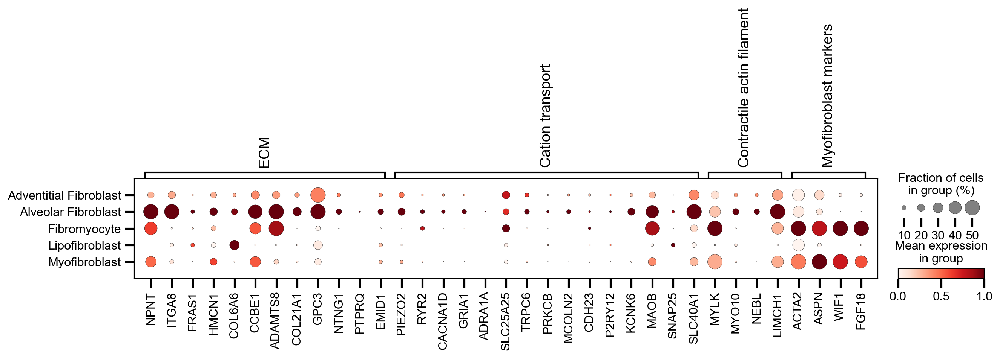

In [194]:
go_gene_dict = {
    'ECM': ['NPNT', 'ITGA8', 'FRAS1', 'HMCN1', 'COL6A6', 'CCBE1', 'ADAMTS8', 'COL21A1', 'GPC3', 'NTNG1', 'PTPRQ', 'EMID1'],
    'Cation transport': ['PIEZO2', 'RYR2', 'CACNA1D', 'GRIA1', 'ADRA1A', 'SLC25A25', 'TRPC6', 'PRKCB', 'MCOLN2', 'CDH23', 'P2RY12', 'KCNK6', 'MAOB', 'SNAP25', 'SLC40A1'],
    'Contractile actin filament': ['MYLK', 'MYO10', 'NEBL', 'LIMCH1'],
    'Myofibroblast markers': ['ACTA2', 'ASPN', 'WIF1', 'FGF18'],
}
sc.pl.dotplot(fib, go_gene_dict, 'free_annotation', standard_scale='var', dot_max=.5)#, save='Figure-S18-D.pdf')

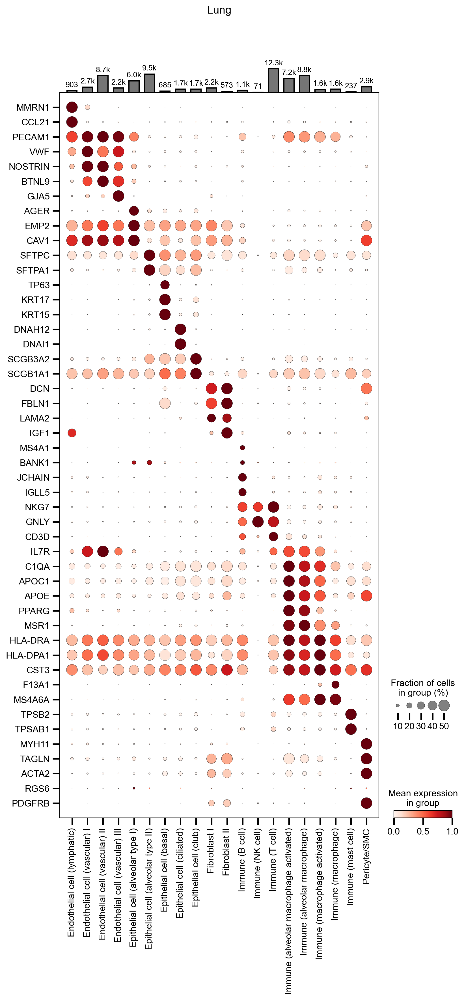

In [89]:
genes = [
    'MMRN1', 'CCL21', 'PECAM1', 'VWF', 'NOSTRIN', 'BTNL9', 'GJA5',
    'AGER', 'EMP2', 'CAV1',
    'SFTPC', 'SFTPA1',
    'TP63', 'KRT17', 'KRT15',
    'DNAH12', 'DNAI1', 'SCGB3A2', 'SCGB1A1',
    'DCN', 'FBLN1', 'LAMA2', 'IGF1',
    'MS4A1', 'BANK1', 'JCHAIN', 'IGLL5',
    'NKG7', 'GNLY', 'CD3D', 'IL7R',
    'C1QA', 'APOC1',  'APOE', 
    'PPARG', 'MSR1', 'HLA-DRA', 'HLA-DPA1', 'CST3',
    'F13A1', 'MS4A6A',
    'TPSB2', 'TPSAB1', 
    'MYH11', 'TAGLN',
    'ACTA2', 'RGS6', 'PDGFRB',
]

g = sc.pl.dotplot(lung, 
                  var_names=genes,
                  standard_scale='var', cmap='Reds', groupby='labels', title='Lung', dot_max=.5, return_fig=True, swap_axes=True)
g.add_totals(color='#757575')
g.savefig('figures/umap-U-lung-dotplot.pdf');